## Dimensions of convergence

## Setup

In [1]:
import pandas as pd
from convergence.nsd import get_subject_roi, get_resource
from mvlearn.embed import KMCCA
import scipy.stats as stats
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tqdm import tqdm
from convergence.nsd import get_image
from PIL import Image, ImageDraw


ModuleNotFoundError: No module named 'mvlearn'

## Functions

In [2]:
def get_shared_stimulus(subject_i, subject_j, query=None):
    df_stimuli = get_resource("stimulus")
    if query is not None:
        df_stimuli = df_stimuli.query(query)
    df_1 = df_stimuli.query("subject == @subject_i and exists and shared")
    df_1 = df_1[["subject", "subject_index", "nsd_id", "repetition"]]
    df_2 = df_stimuli.query("subject == @subject_j and exists and shared")
    df_2 = df_2[["subject", "subject_index", "nsd_id", "repetition"]]
    df = pd.merge(df_1, df_2, on=["nsd_id", "repetition"], suffixes=("_i", "_j"))
    # Reorder
    columns = ["subject_i", "subject_j", "subject_index_i", "subject_index_j"]
    df = df[["nsd_id", "repetition"] + columns]


    return df


def get_shared_stimulus_subset(subjects, query=None, nsd_id_list=None):
    df_stimuli = get_resource("stimulus")
    if query is not None:
        df_stimuli = df_stimuli.query(query)

    if nsd_id_list is not None:
        df_stimuli = df_stimuli.query("nsd_id in @nsd_id_list")

    assert len(subjects) > 0
    subject_0 = subjects[0]
    df_shared = df_stimuli.query(f"subject == {subject_0} and exists and shared")
    df_shared = df_shared[["subject", "subject_index", "nsd_id", "repetition"]]
    df_shared.rename(
        columns={"subject": "subject_0", "subject_index": "subject_index_0"},
        inplace=True,
    )

    for i, subject in enumerate(subjects[1:]):

        df = df_stimuli.query(f"subject == {subject} and exists and shared")
        df = df[["subject", "subject_index", "nsd_id", "repetition"]]
        df.rename(
            columns={
                "subject": f"subject_{i+1}",
                "subject_index": f"subject_index_{i+1}",
            },
            inplace=True,
        )

        df_shared = pd.merge(df_shared, df, on=["nsd_id", "repetition"])

    return df_shared


def get_roi_by_name(names, hemisphere="both"):
    hcp = get_resource("hcp")
    if not isinstance(names, list):
        names = [names]
    rois = hcp[hcp.name.isin(names)].roi.tolist()
    if hemisphere == "right":
        rois = [roi for roi in rois if roi > 180]
    # if left only <180
    elif hemisphere == "left":
        rois = [roi for roi in rois if roi <= 180]
    return rois


def prepare_betas(betas, subject_index, q=0.03):
    betas_subject = betas[subject_index]
    a, b = np.quantile(betas_subject, [q, 1 - q])
    betas_subject = np.clip(betas_subject, a, b)
    betas_subject = (betas_subject - a) / (b - a)
    return betas_subject


def load_variables(nsd_ids=None):
    info = get_resource("coco-objects")
    df_motion = pd.read_parquet(
        "/mnt/tecla/Results/convergence/captions/nsd-pixtral-motion-caption.parquet"
    )

    # pivot supercategory to columns nsd_id as index 1 if the supercategory is present 0 otherwise
    kind_object = "supercategory"
    info = info.drop_duplicates(subset=["nsd_id", kind_object])
    info = (
        info.pivot(index="nsd_id", columns=kind_object, values=kind_object)
        .notnull()
        .astype(int)
    )
    info = info.reset_index()
    df_motion["motion"] = (df_motion["caption"] == "motion").astype(int)
    df_motion["static"] = (df_motion["caption"] == "static").astype(int)
    df_motion = df_motion[["nsd_id", "motion", "static"]]
    info = pd.merge(info, df_motion, on="nsd_id", validate="one_to_one")

    if nsd_ids is not None:
        info = info.set_index("nsd_id")
        info = info.loc[nsd_ids]
        info = info.reset_index()

    return info


def plot_atlas(
    embedding,
    nsd_id=None,
    figsize=(20, 20),
    image_size=0.03,
    pixel_size=80,
    axis=(0, 1),
    pbar=True,
    sample=None,
    color=None,
    dpi=100,
    outline_width=5,
    dataframe_columns = ['cca_1', 'cca_2'],
    color_map=None,
    color_column="image_color",
    add_nsdid=False,
):
    # If embedding is a pandas get the values cca_1, cca_2
    if isinstance(embedding, pd.DataFrame):
        
        nsd_id = embedding["nsd_id"].values
        if color_column in embedding.columns:
            color = embedding[color_column].values
        embedding = embedding[dataframe_columns].values

    embedding = embedding[:, axis].copy()
    for j in range(2):
        embedding[:, j] -= embedding[:, j].min()
        embedding[:, j] /= embedding[:, j].max()

    nsd_id = np.asarray(nsd_id)
    if color is not None:
        color = np.asarray(color)

    if sample is not None:
        n = int(embedding.shape[0] * sample)
        idx = np.random.choice(embedding.shape[0], n, replace=False)
        embedding = embedding[idx]
        nsd_id = nsd_id[idx]
        if color is not None:
            color = color[idx]

    image_size = (image_size, image_size)
    pixel_size = (pixel_size, pixel_size)
    image_width, image_height = image_size

    iterator = list(enumerate(embedding))
    if pbar:
        iterator = tqdm(iterator, leave=False)

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    for i, (x, y) in iterator:
        img = get_image(nsd_id[i])
        img = img.resize(pixel_size, Image.Resampling.LANCZOS)  # Resize image
        if color is not None:
            draw = ImageDraw.Draw(img)
                # The rectangle uses pixel coordinates on the resized image
                # e.g. from (0, 0) to (width - 1, height - 1)
            c = color[i]
            if color_map is not None:
                c = color_map.get(c, "black")
            draw.rectangle(
                [(0, 0), (pixel_size[0]-1, pixel_size[1]-1)],
                outline=c,
                width=outline_width
            )
            if add_nsdid:
                # In the center vertical, and big
                draw.text((pixel_size[0]//5, pixel_size[1]//2), str(nsd_id[i]), fill="green", font_size=25)
        
            img = img.convert("RGB")
        imagebox = np.array(img)
        ax.imshow(
            imagebox,
            extent=(
                x - image_width / 2,
                x + image_width / 2,
                y - image_height / 2,
                y + image_height / 2,
            ),
            aspect="auto",
            zorder=2,
        )

    ax.set_xlim(-0.1, 1.1)
    ax.set_ylim(-0.1, 1.1)
    #ax.axis("off")
    sns.despine(ax=ax)
    ax.grid(False)
    iterator.close()
    return fig, ax


def get_subjects_cca(
    roi_names,
    subjects=(1,2,3,4,5,6,7,8),
    n_components=2,
    regs=0.5,
    kernel="cosine",
    query=None,
    nsd_id_list=None,
    hemisphere="both",
    multiview_output=False,
    **kwargs,
):
    shared_stimuli = get_shared_stimulus_subset(
        subjects=subjects, query=query, nsd_id_list=nsd_id_list
    )

    hub_rois = get_roi_by_name(roi_names, hemisphere=hemisphere)

    betas = []
    for i, subject in enumerate(subjects):
        betas_subject = get_subject_roi(subject, hub_rois)
        subject_index = shared_stimuli[f"subject_index_{i}"].tolist()
        betas_subject = prepare_betas(betas_subject, subject_index=subject_index)
        betas.append(betas_subject)

    cca = KMCCA(
        n_components=n_components,
        regs=regs,
        kernel=kernel,
        n_jobs=-1,
        multiview_output=multiview_output,
        **kwargs,
    )
    projection = cca.fit_transform(betas)
    return projection, cca, shared_stimuli


def projection_to_df(projection, df_shared, group=True, add_variables=True):
    data = {"nsd_id": df_shared.nsd_id}
    nsd_ids = df_shared.nsd_id
    if len(projection.shape) == 3:
        for subject in range(projection.shape[0]):
            for component in range(projection.shape[2]):
                data[f"cca_{subject+1}_{component+1}"] = projection[subject][
                    :, component
                ]
    else:
        for component in range(projection.shape[1]):
            data[f"cca_{component+1}"] = projection[:, component]
    data = pd.DataFrame(data)
    if group:
        data = data.groupby("nsd_id").mean().reset_index()

    if add_variables:
        df_variables = load_variables(nsd_ids).drop_duplicates(subset=["nsd_id"])
        data = pd.merge(data, df_variables, on="nsd_id")
        # Annotations shared 1000
        df_annotations = pd.read_csv("../annotations_shared1000.csv")
        data = pd.merge(data, df_annotations, on="nsd_id", how="left")

    return data

## MVCCA

In [3]:
dorsal_hub = ["MT", "MST", "V4t", "FST", "TPOJ2", "TPOJ3"]
ventral_hub = ["PHA1", "PHA2", "PHA3", "VMV1", "VMV2", "VMV3"]
visual_cortex = ["V1", "V2", "V3", "V4"]
filename_tags = "environ"

In [339]:
rois =  [dorsal_hub, ventral_hub, visual_cortex]
evals = []
for roi in tqdm(rois):
    projection, cca, df_shared = get_subjects_cca(roi_names=roi, n_components=None)
    evals.append(cca.evals_)

100%|██████████| 3/3 [03:01<00:00, 60.44s/it]


In [355]:
c = 2
100*evals[c][1] / evals[c].sum()

6.821202043757124

In [362]:
df_perceptual = pd.read_parquet("/mnt/tecla/Results/convergence/perceptual/nsd-low-level-features.parquet")
df_perceptual

,l,a,b,h,s,v,c,m,y,k,edge_density,contrast,entropy,contrast2,correlation,energy,homogeneity,colorfulness,laplacian_var
0,183.510876,239.038035,92.934738,68.488958,19.771720,180.605974,84.168332,75.759098,80.133049,0.0,18.457412,37.555828,6.791747,120.574695,0.957288,0.046906,0.399711,111.707668,913.657993
1,151.251128,76.863480,51.767557,56.496808,49.819383,153.512775,104.165387,109.723859,118.950206,0.0,7.699765,70.811551,7.266772,84.274440,0.991604,0.044150,0.507279,108.764083,384.379625
2,106.410940,67.708861,36.503790,25.455070,141.722757,122.434060,136.165071,160.103087,197.951380,0.0,20.085176,41.347086,7.279130,123.316787,0.963986,0.021072,0.252926,70.691419,599.035989
3,96.247817,55.890292,81.521484,50.968044,134.516053,119.369528,157.201307,169.298447,173.252152,0.0,22.634824,58.181098,7.538289,154.559079,0.977161,0.023980,0.346221,69.004592,775.406427
4,142.400493,81.949254,92.365802,56.555316,36.054001,144.515682,118.251289,118.608814,118.978962,0.0,33.875294,64.151178,7.651584,355.404784,0.956827,0.026382,0.312873,90.646915,3430.800022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72995,140.617761,214.844866,108.465871,78.710378,48.878245,147.633428,121.254107,121.486361,120.706530,0.0,8.507294,67.715703,7.709685,117.180511,0.987230,0.029975,0.389024,93.025157,434.304595
72996,143.845165,48.037033,148.674181,81.991158,48.039286,149.798217,118.061055,118.553030,114.368155,0.0,35.781176,53.577074,7.497071,532.268180,0.907239,0.016024,0.164465,105.050460,4102.118256
72997,120.140169,78.549968,83.666248,46.807419,74.642358,131.162746,136.231374,139.482264,144.271878,0.0,45.393882,78.569493,7.548064,714.591176,0.942181,0.042196,0.208005,83.613904,4988.851337
72998,105.856714,71.895662,94.321971,57.188922,135.418170,136.220911,150.593877,163.131051,156.343236,0.0,21.536471,50.588315,7.219618,160.315044,0.968669,0.048087,0.468637,81.670842,1150.648392


In [ ]:


# rois = dorsal_hub + ventral_hub + visual_cortex + [dorsal_hub, ventral_hub, visual_cortex]
# df = []
# for roi in tqdm(rois):
    
#     projection, cca, df_shared = get_subjects_cca(roi_names=roi)
#     df_projection = projection_to_df(projection, df_shared)
#     roi_name = roi if isinstance(roi, str) else "_".join(roi)
#     df_projection["roi"] = roi_name
#     df.append(df_projection)

# df = pd.concat(df)
# df.roi = df.roi.replace({'MT_MST_V4t_FST_TPOJ2_TPOJ3': 'dorsal_hub', 'PHA1_PHA2_PHA3_VMV1_VMV2_VMV3': 'ventral_hub', 'V1_V2_V3_V4': 'visual_cortex'})
#df.to_parquet("cca_projections.parquet")

In [330]:
df = pd.read_parquet("cca_projections2.parquet")
df

,nsd_id,cca_1,cca_2,accessory,animal,appliance,electronic,food,furniture,indoor,...,outdoor,person,sports,vehicle,motion,static,image_category,image_color,roi,environment
0,2950,-0.004921,-0.023193,1,0,0,0,1,0,0,...,0,1,0,0,0,1,person_action,#AEC7E8,MT,outdoor urban
1,2990,-0.016419,0.002581,0,0,1,0,1,0,0,...,0,1,0,0,0,1,person_action,#AEC7E8,MT,indoor
2,3049,-0.028592,0.013644,0,0,0,0,0,0,0,...,0,1,1,0,1,0,sports,#1F77B4,MT,outdoor natural
3,3077,0.004541,-0.020908,0,0,0,0,0,0,0,...,0,1,1,1,1,0,sports,#1F77B4,MT,outdoor natural
4,3146,0.025782,-0.009063,0,0,0,0,0,0,1,...,0,0,0,0,0,1,scene,#FF7F0E,MT,outdoor urban
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17228,72312,0.028995,-0.008347,1,0,0,0,0,0,0,...,0,1,1,0,1,0,sports,#1F77B4,visual_cortex,outdoor natural
17229,72510,0.050095,-0.007808,0,0,0,0,0,0,0,...,0,0,0,1,0,1,vehicle,#98DF8A,visual_cortex,outdoor urban
17230,72605,0.000878,0.034270,0,1,0,0,0,0,0,...,0,0,0,0,0,1,animal,#2CA02C,visual_cortex,outdoor natural
17231,72719,-0.007380,-0.009229,0,0,0,0,0,1,0,...,0,0,1,1,0,1,scene,#FF7F0E,visual_cortex,indoor


In [305]:
df_foreground = pd.read_parquet("foreground_percentage.parquet")

In [322]:
df_scenes_dominated = pd.read_csv("scene_dominated.csv")
df_scenes_dominated.caption = df_scenes_dominated.caption.str.replace("'", "").str.lower().str.replace(".", "").str.replace("sce-", "scene-")
df_scenes_dominated = df_scenes_dominated[["nsd_id", "caption"]].rename(columns={"caption": "scene_dominated"})
df_scenes_dominated

,nsd_id,scene_dominated
0,2950,scene-dominated
1,2990,object-in-scene
2,3049,object-in-scene
3,3077,scene-dominated
4,3146,scene-dominated
...,...,...
995,72312,scene-dominated
996,72510,scene-dominated
997,72605,object-in-scene
998,72719,object-in-scene


In [331]:
df3 = df.copy()
df3["environment2"] = df3["environment"]
df3.loc[df3.image_category.isin(["animal", "person_action", "sports"]), "environment2"] +=  " life"
df3 = df3.merge(df_scenes_dominated, on="nsd_id")

In [332]:
df3

,nsd_id,cca_1,cca_2,accessory,animal,appliance,electronic,food,furniture,indoor,...,sports,vehicle,motion,static,image_category,image_color,roi,environment,environment2,scene_dominated
0,2950,-0.004921,-0.023193,1,0,0,0,1,0,0,...,0,0,0,1,person_action,#AEC7E8,MT,outdoor urban,outdoor urban life,scene-dominated
1,2990,-0.016419,0.002581,0,0,1,0,1,0,0,...,0,0,0,1,person_action,#AEC7E8,MT,indoor,indoor life,object-in-scene
2,3049,-0.028592,0.013644,0,0,0,0,0,0,0,...,1,0,1,0,sports,#1F77B4,MT,outdoor natural,outdoor natural life,object-in-scene
3,3077,0.004541,-0.020908,0,0,0,0,0,0,0,...,1,1,1,0,sports,#1F77B4,MT,outdoor natural,outdoor natural life,scene-dominated
4,3146,0.025782,-0.009063,0,0,0,0,0,0,1,...,0,0,0,1,scene,#FF7F0E,MT,outdoor urban,outdoor urban,scene-dominated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17228,72312,0.028995,-0.008347,1,0,0,0,0,0,0,...,1,0,1,0,sports,#1F77B4,visual_cortex,outdoor natural,outdoor natural life,scene-dominated
17229,72510,0.050095,-0.007808,0,0,0,0,0,0,0,...,0,1,0,1,vehicle,#98DF8A,visual_cortex,outdoor urban,outdoor urban,scene-dominated
17230,72605,0.000878,0.034270,0,1,0,0,0,0,0,...,0,0,0,1,animal,#2CA02C,visual_cortex,outdoor natural,outdoor natural life,object-in-scene
17231,72719,-0.007380,-0.009229,0,0,0,0,0,1,0,...,1,1,0,1,scene,#FF7F0E,visual_cortex,indoor,indoor,object-in-scene


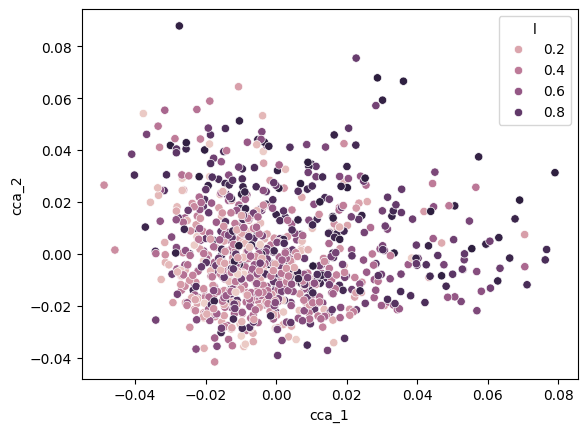

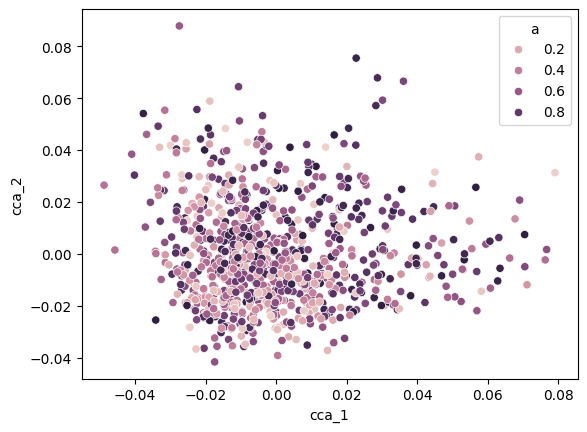

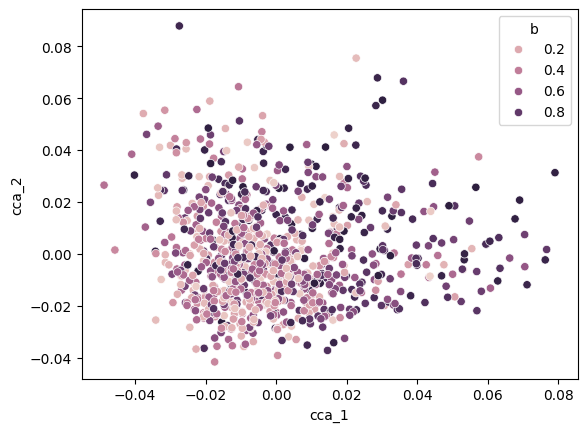

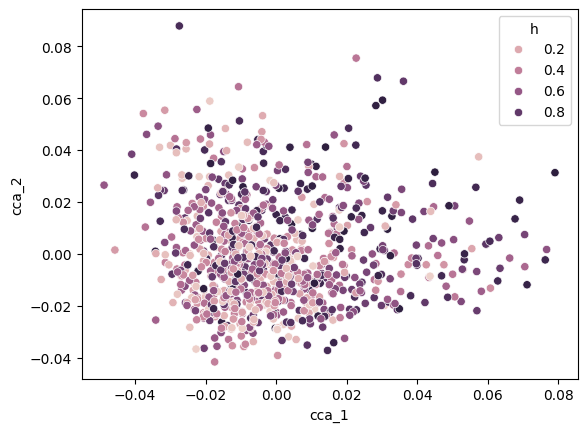

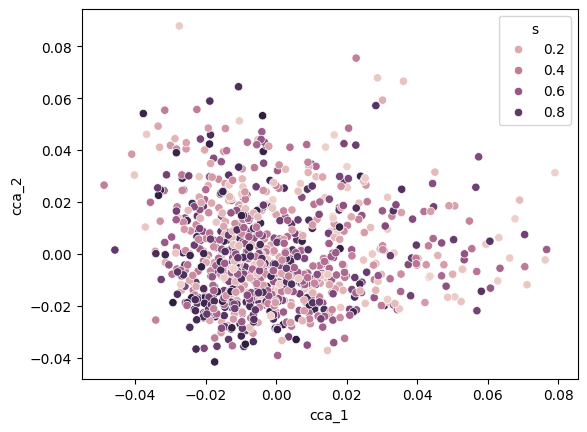

...

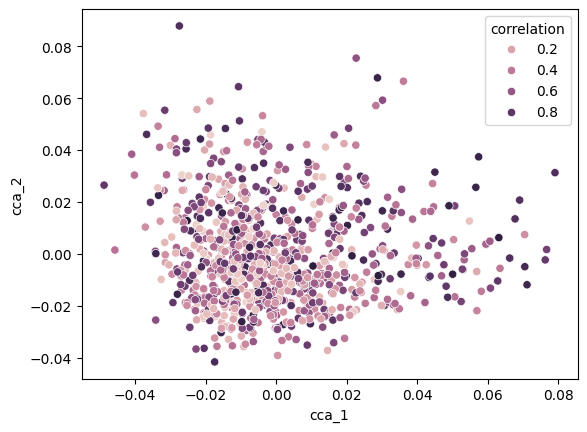

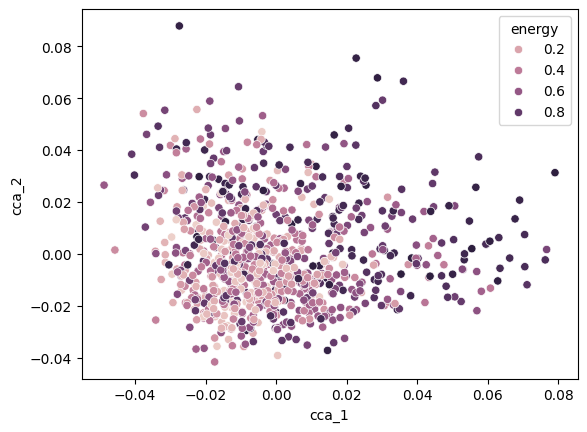

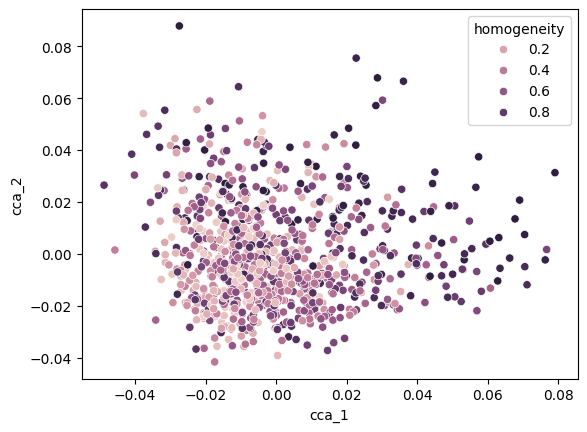

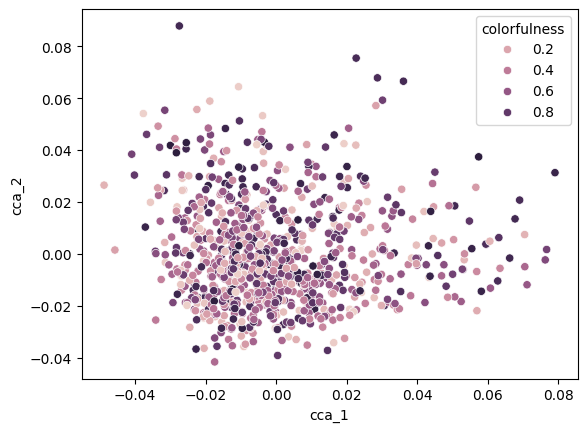

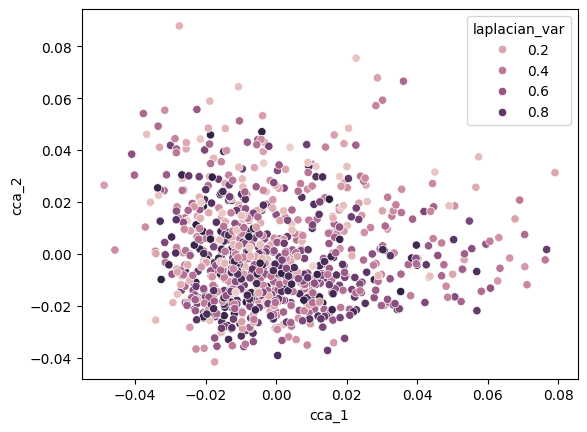

In [375]:
df4 = df3.copy()
df_perceptual_rank = df_perceptual.drop(columns='k').rank(pct=True)

df4 = df4.merge(df_perceptual_rank.reset_index().rename(columns={"index": "nsd_id"}), on="nsd_id")

for c in df_perceptual.columns:
    if c == 'k': continue
    plt.figure()
    sns.scatterplot(data=df4.query("roi=='visual_cortex'"), x="cca_1", y="cca_2", hue=c)
    plt.show()
#Convert in rank all variables


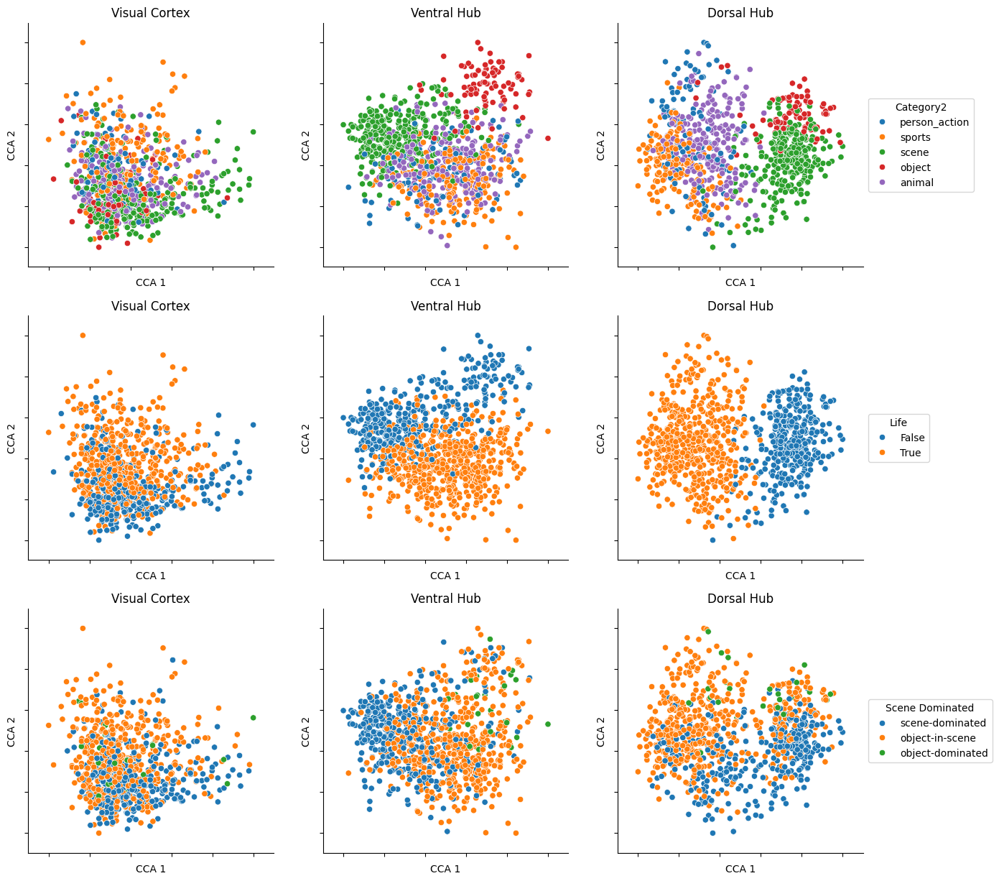

In [376]:
# Legend out
df3["outdoor"] = df3.environment.str.contains("outdoor")
df3["life"] = df3.environment2.str.contains("life") | df3.nsd_id.isin(
    [13230, 69854, 43852]
)
hue = "life"


def scatter_plots(
    df,
    hue,
    x="cca_1",
    y="cca_2",
    rois=["visual_cortex", "ventral_hub", "dorsal_hub"],
    s=5,
    axis_names=["CCA 1", "CCA 2"],
):
    if isinstance(hue, str):
        hue = [hue]

    n_rows = len(hue)
    n_columns = len(rois)

    fig, axes = plt.subplots(n_rows, n_columns, figsize=(s * n_columns, s * n_rows))

    for i, roi in enumerate(rois):
        df_scatter = df.query(f"roi=='{roi}'")[[x, y] + hue].copy()

        # Normalize x, y
        df_scatter[x] -= df_scatter[x].min()
        df_scatter[x] /= df_scatter[x].max()
        df_scatter[y] -= df_scatter[y].min()
        df_scatter[y] /= df_scatter[y].max()

        for j, h in enumerate(hue):
            ax = axes[j, i]
            legend = i == n_columns - 1
            sns.scatterplot(data=df_scatter, x=x, y=y, hue=h, ax=ax, legend=legend)
            if legend:
                ax.legend(
                    loc="center left",
                    bbox_to_anchor=(1, 0.5),
                    ncol=1,
                    title=h.replace("_", " ").title(),
                )
            sns.despine(ax=ax)
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_title(roi.replace("_", " ").title())
            ax.set_xlabel(axis_names[0])
            ax.set_ylabel(axis_names[1])
            ax.axis("equal")
            ax.set_xlim(-0.1, 1.1)
            ax.set_ylim(-0.1, 1.1)
            # Add an auxiliary histogram to the x axis with a distplots
            # Add the axis to the bottom
            # if j > 0:
            #     big_position = ax.get_position()
            #     # Small axis (x0, y0, x1, y1)
            #     small_position = [big_position.x0, big_position.y0, big_position.width, big_position.height/10]
            #     ax_hist = fig.add_axes(small_position, frame_on=True)
            #     sns.kdeplot(data=df_scatter, x=x, ax=ax_hist, color="gray", hue=h, fill=True, common_norm=False, legend=False, zorder=-1000)
            #     # Only let the x axis visible
            #     ax_hist.axis("off")

    return fig, axes

df3["category2"] = df3.image_category
df3.loc[df3.category2 == "food", "category2"] = "scene"
df3.loc[df3.category2 == "vehicle", "category2"] = "scene"
df3.loc[df3.environment == "object", "category2"] = "object"


fig, axes = scatter_plots(df3, hue=["category2", "life",  "scene_dominated"])


In [377]:
df3

,nsd_id,cca_1,cca_2,accessory,animal,appliance,electronic,food,furniture,indoor,...,motion,static,image_category,image_color,roi,environment,environment2,scene_dominated,life,category2
0,2950,-0.004921,-0.023193,1,0,0,0,1,0,0,...,0,1,person_action,#AEC7E8,MT,outdoor urban,outdoor urban life,scene-dominated,True,person_action
1,2990,-0.016419,0.002581,0,0,1,0,1,0,0,...,0,1,person_action,#AEC7E8,MT,indoor,indoor life,object-in-scene,True,person_action
2,3049,-0.028592,0.013644,0,0,0,0,0,0,0,...,1,0,sports,#1F77B4,MT,outdoor natural,outdoor natural life,object-in-scene,True,sports
3,3077,0.004541,-0.020908,0,0,0,0,0,0,0,...,1,0,sports,#1F77B4,MT,outdoor natural,outdoor natural life,scene-dominated,True,sports
4,3146,0.025782,-0.009063,0,0,0,0,0,0,1,...,0,1,scene,#FF7F0E,MT,outdoor urban,outdoor urban,scene-dominated,False,scene
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17228,72312,0.028995,-0.008347,1,0,0,0,0,0,0,...,1,0,sports,#1F77B4,visual_cortex,outdoor natural,outdoor natural life,scene-dominated,True,sports
17229,72510,0.050095,-0.007808,0,0,0,0,0,0,0,...,0,1,vehicle,#98DF8A,visual_cortex,outdoor urban,outdoor urban,scene-dominated,False,scene
17230,72605,0.000878,0.034270,0,1,0,0,0,0,0,...,0,1,animal,#2CA02C,visual_cortex,outdoor natural,outdoor natural life,object-in-scene,True,animal
17231,72719,-0.007380,-0.009229,0,0,0,0,0,1,0,...,0,1,scene,#FF7F0E,visual_cortex,indoor,indoor,object-in-scene,False,scene


df.roi

(-0.1, 1.1, -0.1, 1.1)

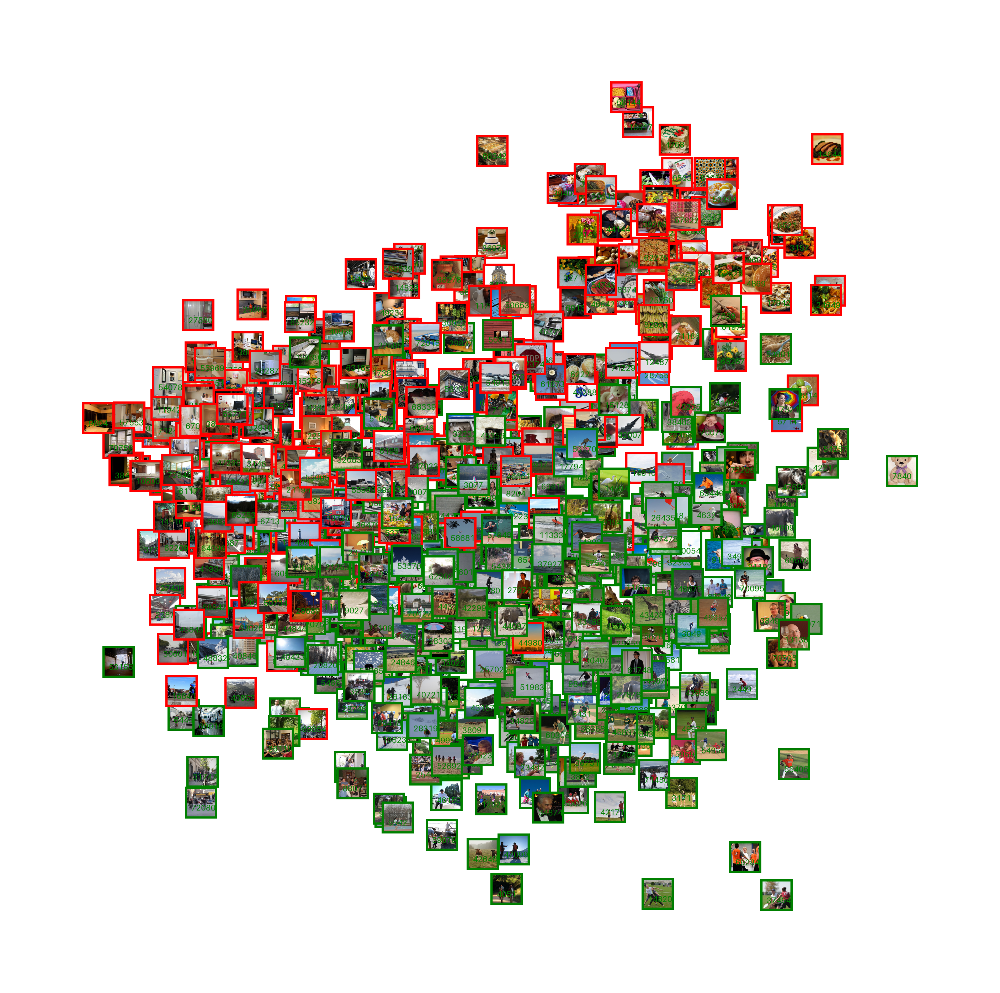

In [232]:
roi = "ventral_hub"
fig, ax = plot_atlas(
    df3.query(f"roi=='{roi}'").sample(frac=1),
    image_size=0.04,
    figsize=(7, 7),
    pixel_size=100,
    dpi=500,
    outline_width=7,
    color_column="life",
    color_map={True: "green", False: "red"},
    #color_map={"outdoor natural": "green", "outdoor urban": "blue", "indoor": "red", "object": "orange"},
    add_nsdid=True,
)
ax.axis('off')
#fig.savefig(f"{roi}.pdf", bbox_inches='tight', pad_inches=0, transparent=True)

In [241]:
# Plotly interactive scatter plot to explore the data of ventral_hub
import plotly.express as px

natural = []
urban = []
objects = []
indoor = []

natural = [59284, 70505, 55107]
urban = [65414]
objects = [51521, 46327,6222,15128,67237,39369,42473,6558,11796,36978,69839,14528]
indoor = []
df_2 =  df.query("roi=='ventral_hub'").copy()
# Normalize cca to -1 to 1
df_2["cca_1"] = (df_2["cca_1"] - df_2["cca_1"].min()) / (df_2["cca_1"].max() - df_2["cca_1"].min())
df_2["cca_2"] = (df_2["cca_2"] - df_2["cca_2"].min()) / (df_2["cca_2"].max() - df_2["cca_2"].min())


fig = px.scatter(
    df3.query("roi=='ventral_hub'").sort_values("environment", ascending=False),
    x="cca_1",
    y="cca_2",
    color="life",
    hover_data=["nsd_id", "roi"],
    title="CCA Projection",
)
# 
# Equalize aspect ratio
fig.update_xaxes(scaleanchor="y", scaleratio=1)
fig.show()

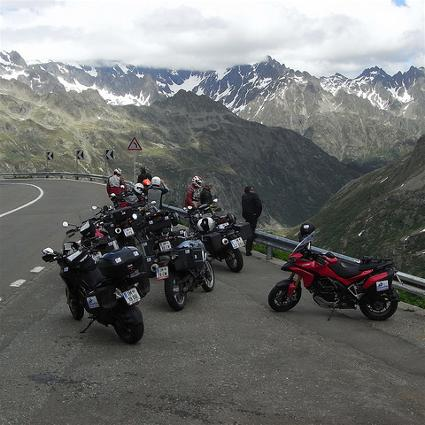

In [ ]:
# Natural 65414, 60305
# Indoor Person 
# Urban 42007
# Objects 6558, 67237
# Outdoor 

# Life 
# Person action 

get_image(43852)